# Waste Classification

## 1. Problem Statement

Waste Management is one of the most pressing issues globally, significantly contributing to Global Warming and Climate Change. The improper handling of waste is a key factor, with the waste sector responsible for 10% of global greenhouse gas (GHG) emissions, according to a [U.N article](https://www.unodc.org/unodc/en/environment-climate/cop27-unmanaged-waste.html). Open dumping accounts for 31% of these emissions, with lower-income countries relying on it for up to 93% of their waste disposal. Mismanaged waste often ends up in public ecosystems, illegal landfills, or is openly burned, exacerbating environmental and health issues. Effective recycling is essential to mitigate these problems, requiring the proper sorting of waste materials.

Leveraging the advancements in Computer Vision and Image Processing within Artificial Intelligence, this project aims to develop a neural network model to classify solid household waste into various categories. This technology can be further commercialized for use by waste management companies, potentially integrating with Unmanned Aerial Vehicles (UAVs) for real-time waste monitoring. The project will enhance transparency in waste management systems by detecting and documenting waste details, including images and locations, accessible online. This system will alert municipalities and officials, compelling them to take timely and responsible action to manage and clean waste effectively.

**Project Objectives:**

1. **Develop a Deep Learning Model:** Create a highly accurate neural network capable of classifying solid household waste into categories such as paper, cardboard, biological, metal, plastic, green glass, brown glass, white glass, clothes, shoes, batteries, and trash. If this is achieved, we will be addressing some SDG Goals including:

   - Goal 2: Zero Hunger 
   - Goal 6: Clean Water and Sanitation
   - Goal 7: Affordable and Clean Energy
   - Goal 11: Sustainable Cities and Communities
   - Goal 13: Climate Action
   - Goal 14: Life Below Water
   - Goal 15: Life on Land
   

2. **Enhance Recycling Techniques (SDG Goal 2):** Improve and optimize recycling processes to facilitate the production of fertilizers, benefiting farmers and contributing to ending hunger, achieving food security, improving nutrition and promoting sustainable agriculture.

3. **Facilitate Waste Detection and Management:** Implement a system for efficient waste detection across various locations, ensuring timely and effective waste clearance and management by relevant authorities.


## 2. Data Description

This dataset has 15,150 images from 12 different classes of household garbage; paper, cardboard, biological, metal, plastic, green-glass, brown-glass, white-glass, clothes, shoes, batteries, and trash.

The clothes category and 22 % of the shoes' category were obtained from the Clothing dataset https://www.kaggle.com/agrigorev/clothing-dataset-full
Around 29% of the other 9 classes combined was collected from the Garbage Classification dataset https://www.kaggle.com/asdasdasasdas/garbage-classification
All the rest of the images were obtained using Web Scrapping.
All the images collected using web scrapping are owned by their original photographers/owners. The images are only used to promote research and is not used to generate any profit.

Data Source: https://www.kaggle.com/datasets/mostafaabla/garbage-classification


## 3. Table of Contents

1. [Problem Statement](#1.-Problem-Statement) 

2. [Data Description](#2.-Data-Description)

3. [Table of Contents](#3.-Table-of-Contents)

4. [Importation of Libraries and Packages](#4.-Importation-of-Libraries-and-Packages)

5. [Data Importation](5.-Data-Importation)

6. [Data Cleaning and Validation](#6.-Data-Cleaning-and-Validation)

7. [Exploratory Data Analysis](#7.-Exploratory-Data-Analysis)

8. [Data Preprocessing](#8.-Data-Preprocessing)

9. [Model Building](#9.-Model-Building)

10. [Model Comparison](#10.-Model-Comparison)

11. [Model Selection](#11.-Model-Selection)

12. [Summary](#12.-Summary)


## 4. Importation of Libraries and Packages

In [1]:
# Import standard libraries
import os
import math
import cv2
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from glob import glob

# Scikit-learn for model selection and utilities
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, f1_score

# TensorFlow and Keras for deep learning
import tensorflow as tf
from tensorflow.keras.preprocessing import image as ku
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img, load_img
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D, BatchNormalization, Dropout, SpatialDropout2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import sparse_categorical_crossentropy, binary_crossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Specific models and preprocess functions from Keras applications
from tensorflow.keras.applications import ResNet50, DenseNet121, DenseNet201, VGG16, VGG19, InceptionV3
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet
from tensorflow.keras.applications.densenet import preprocess_input as preprocess_densenet
from tensorflow.keras.applications.vgg19 import preprocess_input as preprocess_vgg19
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg16


RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
import warnings
warnings.filterwarnings("ignore")

2024-06-06 13:35:45.959609: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-06 13:35:45.959729: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-06 13:35:46.080023: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## 5. Data Importation

In [2]:
# Define the path to the data directory
data_dir = '/kaggle/input/garbage-classification/garbage_classification'

## 6. Data Cleaning and Validation

In [3]:
# Initialize empty lists to hold image data and labels
images = []
labels = []

# Define the classes (directories) in your dataset
classes = ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']

# Load images from the directories
for label, class_name in enumerate(classes):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.exists(class_dir):
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.resize(img, (224, 224)) 
                images.append(img)
                labels.append(label)

# Convert lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)
# Use stratify for distribution

print(f"Training data shape: {X_train.shape}")
print(f"Testing data shape: {X_test.shape}")

Training data shape: (12412, 224, 224, 3)
Testing data shape: (3103, 224, 224, 3)


## 7. Exploratory Data Analysis

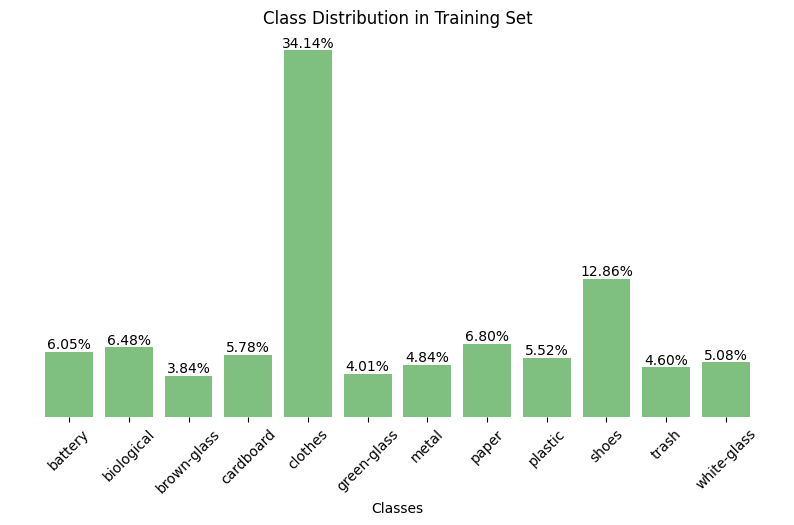

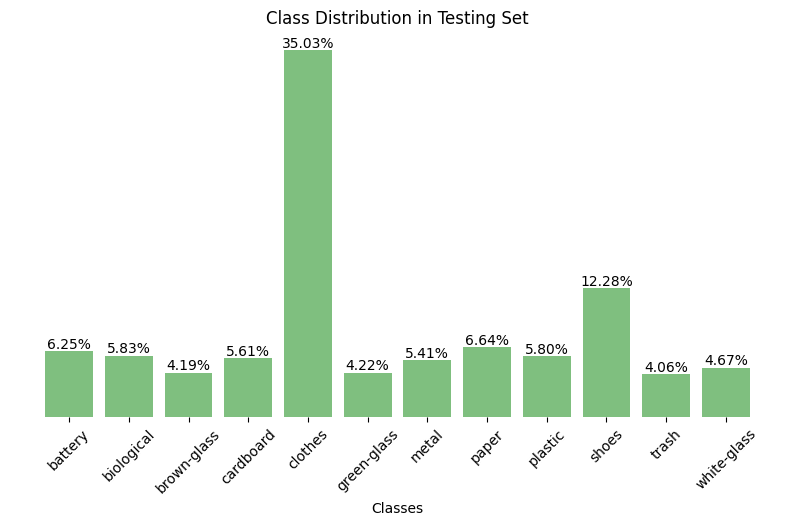

In [22]:
# Calculate class distribution in training set
train_distribution = np.bincount(y_train) / len(y_train) * 100

# Calculate class distribution in testing set
test_distribution = np.bincount(y_test) / len(y_test) * 100

# Plotting for training set
plt.figure(figsize=(10, 5))
plt.bar(classes, train_distribution, alpha=0.5, color='green')
plt.title('Class Distribution in Training Set')
plt.xlabel('Classes')
plt.xticks(rotation=45)
plt.yticks([])
plt.gca().yaxis.set_major_formatter(plt.NullFormatter())  # Hide y-axis
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# Annotate percentages on bars
for i, perc in enumerate(train_distribution):
    plt.text(i, perc, f'{perc:.2f}%', ha='center', va='bottom')

plt.show()

# Plotting for testing set
plt.figure(figsize=(10, 5))
plt.bar(classes, test_distribution, alpha=0.5, color='green')
plt.title('Class Distribution in Testing Set')
plt.xlabel('Classes')
plt.xticks(rotation=45)
plt.yticks([])
plt.gca().yaxis.set_major_formatter(plt.NullFormatter())  # Hide y-axis
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
# Annotate percentages on bars
for i, perc in enumerate(test_distribution):
    plt.text(i, perc, f'{perc:.2f}%', ha='center', va='bottom')

plt.show()


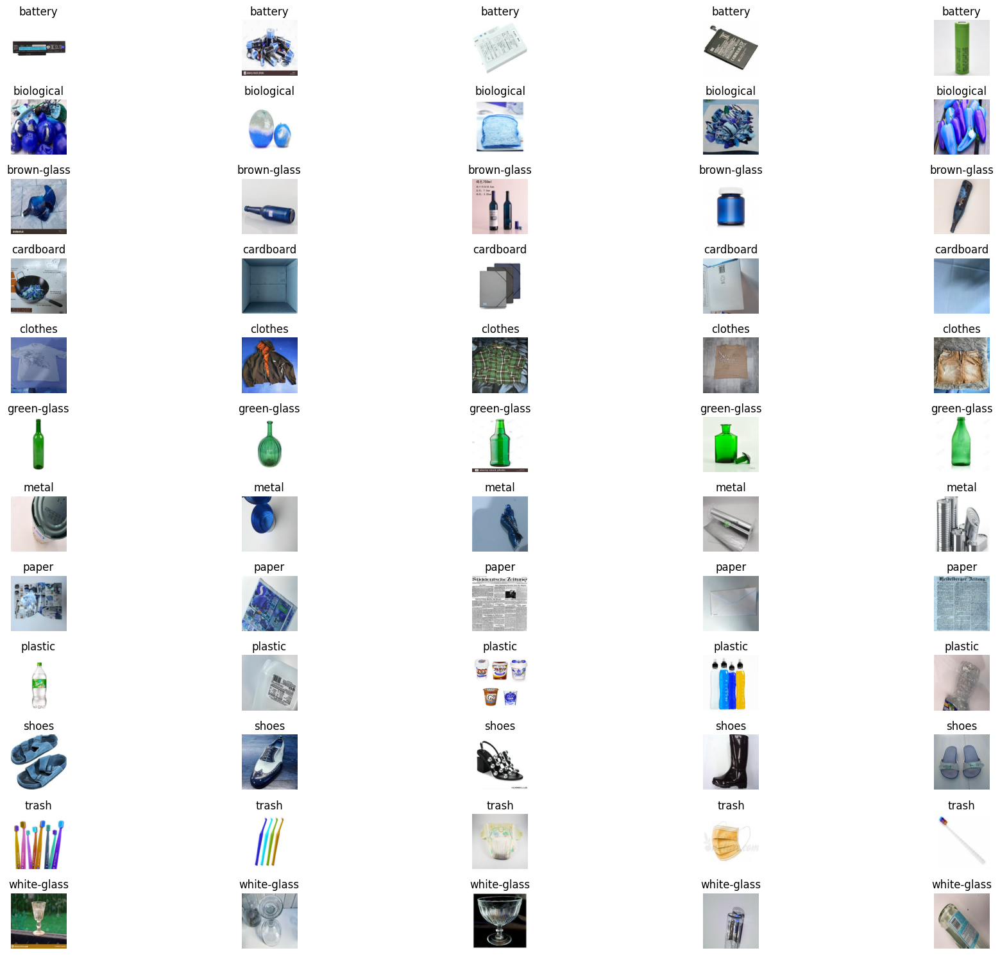

In [23]:
# Function to show sample images
def show_sample_images(image_paths, labels, class_names, samples_per_class=5):
    plt.figure(figsize=(20, 15))
    for label, class_name in enumerate(class_names):
        class_indices = np.where(labels == label)[0]
        sample_indices = np.random.choice(class_indices, samples_per_class, replace=False)
        for i, idx in enumerate(sample_indices):
            plt.subplot(len(class_names), samples_per_class, label * samples_per_class + i + 1)
            plt.imshow(image_paths[idx])
            plt.title(f"{class_name}")
            plt.axis('off')
    plt.tight_layout()
    plt.show()

# Show sample images from the dataset
show_sample_images(images, labels, classes, samples_per_class=5)


## 8. Data Preprocessing

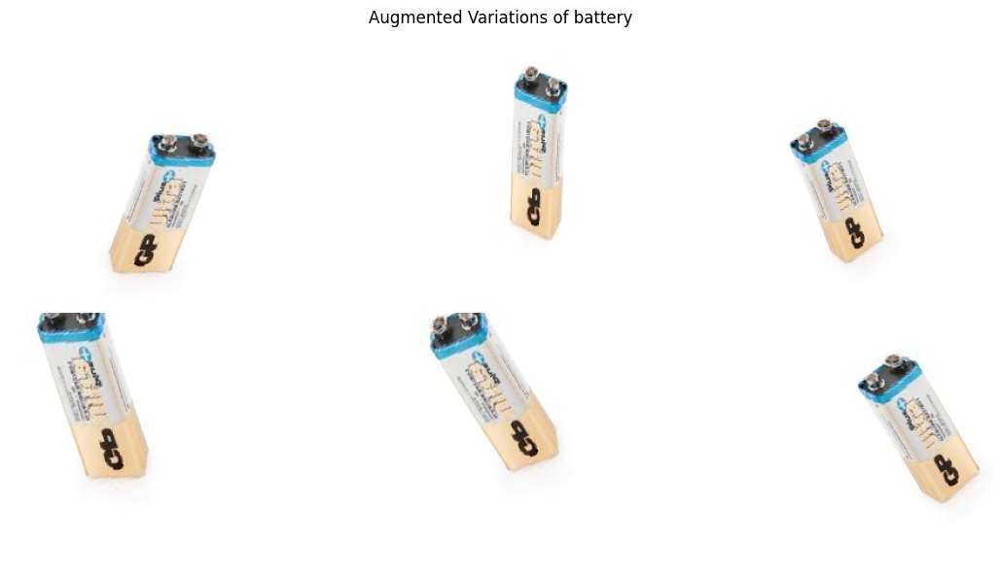

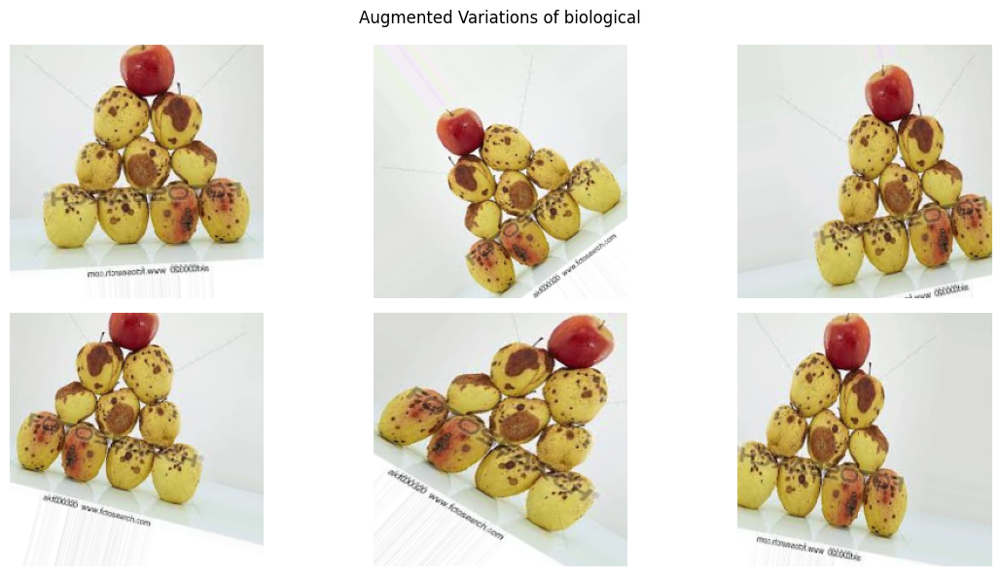

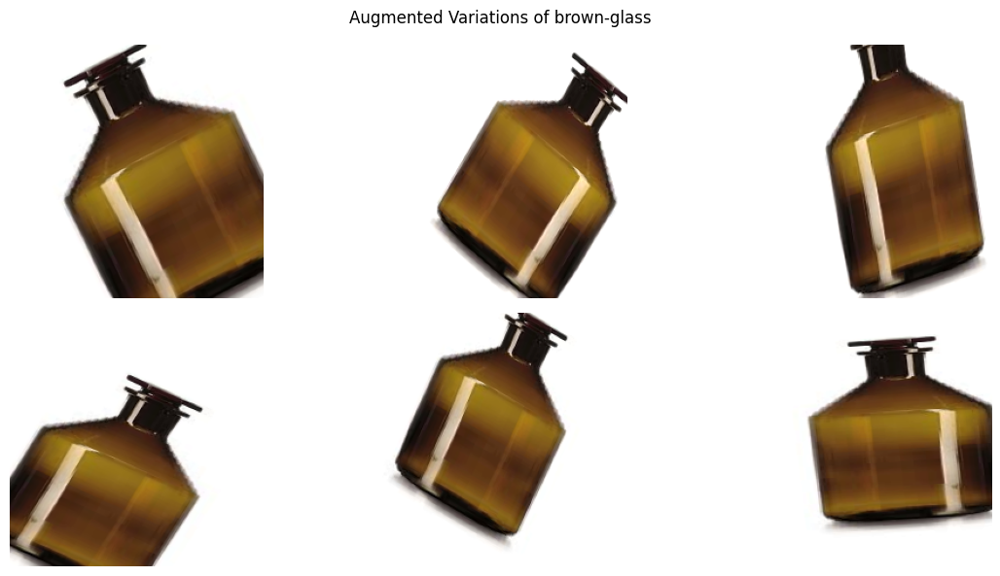

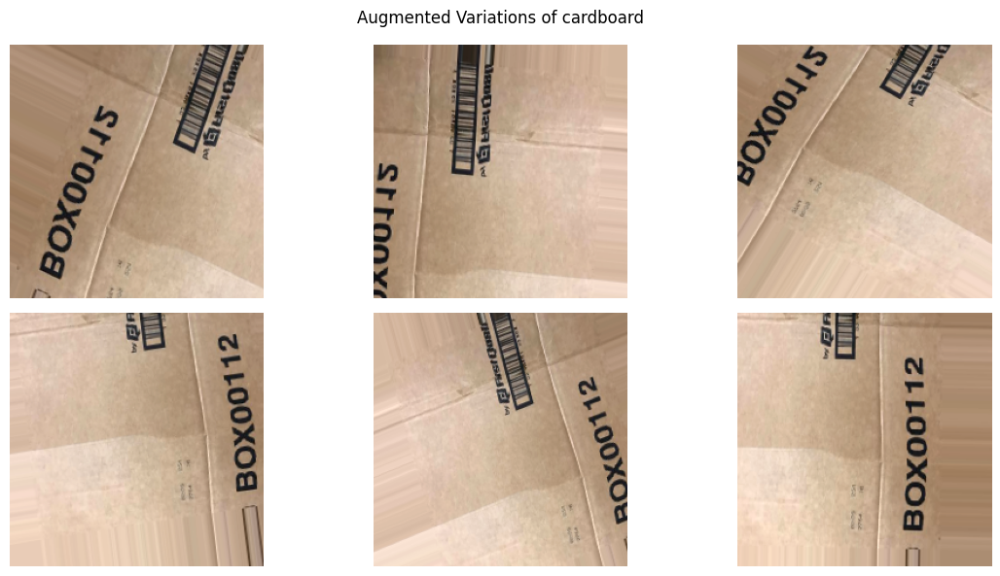

In [ ]:
# Load one image from each class
sample_images = []
for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    img_name = os.listdir(class_dir)[0]  # Assuming there's at least one image per class
    img_path = os.path.join(class_dir, img_name)
    img = load_img(img_path, target_size=(224, 224))
    sample_images.append(img)

# Initialize ImageDataGenerator with augmentation parameters
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.8, 1.2],
    channel_shift_range=0.1
)


# For the validation and test sets, we usually only rescale the images
test_datagen = ImageDataGenerator(rescale=1./255)

# Convert training and testing data to the format expected by ImageDataGenerator
train_generator = train_datagen.flow(
    X_train, y_train,
    batch_size=32
)

validation_generator = test_datagen.flow(
    X_test, y_test,
    batch_size=32
)



# Function to plot augmented images
def plot_augmented_images(original_img, augmentations, title):
    plt.figure(figsize=(12, 6))
    for i in range(1, augmentations + 1):
        plt.subplot(2, augmentations // 2, i)
        plt.imshow(array_to_img(next(train_datagen.flow(np.expand_dims(original_img, 0)))[0]))
        plt.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Apply augmentations and plot the images
for i, img in enumerate(sample_images):
    img_array = img_to_array(img)  # Convert to array
    plot_augmented_images(img_array, 6, f"Augmented Variations of {classes[i]}")




## 9. Model Building

#### Custom CNN

In [7]:
# Custom CNN Model
cnn_model = Sequential()
cnn_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Flatten())
cnn_model.add(Dense(256, activation='relu'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Dense(len(classes), activation='softmax'))
cnn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)


# Train the model
cnn_history = cnn_model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator,
    callbacks=[early_stopping]
)

cnn_model.summary()

Epoch 1/15


2024-06-06 13:45:36.235250: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49284: 7.84353, expected 6.92193
2024-06-06 13:45:36.235309: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49286: 7.76792, expected 6.84632
2024-06-06 13:45:36.235319: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49287: 6.15631, expected 5.23472
2024-06-06 13:45:36.235327: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49288: 6.71859, expected 5.797
2024-06-06 13:45:36.235335: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49289: 7.43913, expected 6.51753
2024-06-06 13:45:36.235344: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49290: 7.1783, expected 6.25671
2024-06-06 13:45:36.235352: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49291: 6.06838, expected 5.14679
2024-06-06 13:45:36.235360: E 

  1/388 ━━━━━━━━━━━━━━━━━━━━ 1:23:17 13s/step - accuracy: 0.0000e+00 - loss: 2.4959

I0000 00:00:1717681542.611163     112 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


167/388 ━━━━━━━━━━━━━━━━━━━━ 1:21 367ms/step - accuracy: 0.3504 - loss: 2.1209

2024-06-06 13:46:44.918938: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 147859: 4.5423, expected 3.98255
2024-06-06 13:46:44.919010: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 147863: 4.02616, expected 3.46642
2024-06-06 13:46:44.919026: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 147864: 4.20688, expected 3.64714
2024-06-06 13:46:44.919044: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 147914: 3.74231, expected 3.18257
2024-06-06 13:46:44.919056: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 147917: 4.55879, expected 3.99905
2024-06-06 13:46:44.919066: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 147935: 4.34856, expected 3.78882
2024-06-06 13:46:44.919078: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 148028: 4.39055, expected 3.83081
2024-06-06 13:46:44.9

387/388 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.3846 - loss: 2.0239

2024-06-06 13:48:16.059188: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 12: 5.07642, expected 4.43595
2024-06-06 13:48:16.059250: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 180: 5.23389, expected 4.59342
2024-06-06 13:48:16.059266: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 197: 5.03202, expected 4.39155
2024-06-06 13:48:16.059295: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 627: 5.38588, expected 4.74541
2024-06-06 13:48:16.059310: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 999: 5.39291, expected 4.75244
2024-06-06 13:48:16.059324: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1510: 4.75906, expected 4.11859
2024-06-06 13:48:16.059345: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2837: 5.36889, expected 4.72842
2024-06-06 13:48:16.059356: E external/l

388/388 ━━━━━━━━━━━━━━━━━━━━ 168s 402ms/step - accuracy: 0.3848 - loss: 2.0229 - val_accuracy: 0.5401 - val_loss: 8.5409
Epoch 2/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 147s 372ms/step - accuracy: 0.5097 - loss: 2.0846 - val_accuracy: 0.5624 - val_loss: 6.9508
Epoch 3/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 147s 372ms/step - accuracy: 0.5286 - loss: 1.7484 - val_accuracy: 0.5991 - val_loss: 2.8943
Epoch 4/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 147s 372ms/step - accuracy: 0.5444 - loss: 1.6462 - val_accuracy: 0.6088 - val_loss: 2.6791
Epoch 5/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 145s 366ms/step - accuracy: 0.5579 - loss: 1.3470 - val_accuracy: 0.6416 - val_loss: 1.6604
Epoch 6/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 144s 364ms/step - accuracy: 0.5725 - loss: 1.4219 - val_accuracy: 0.6629 - val_loss: 1.5873
Epoch 7/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 144s 365ms/step - accuracy: 0.5914 - loss: 1.2790 - val_accuracy: 0.6387 - val_loss: 2.2805
Epoch 8/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 142s 360ms/step - accuracy: 0.5819 - loss: 1.31

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    22,151,424 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │         3,084 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 66,743,270 (254.61 MB)

 Trainable params: 22,247,756 (84.87 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 44,495,514 (169.74 MB)

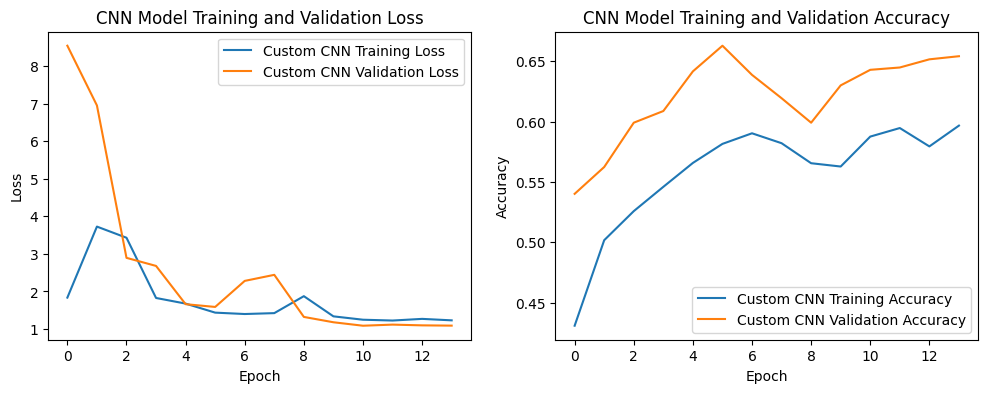

In [8]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 2)
plt.plot(cnn_history.history['accuracy'], label='Custom CNN Training Accuracy')
plt.plot(cnn_history.history['val_accuracy'], label='Custom CNN Validation Accuracy')
plt.legend()
plt.title('CNN Model Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 1)
plt.plot(cnn_history.history['loss'], label='Custom CNN Training Loss')
plt.plot(cnn_history.history['val_loss'], label='Custom CNN Validation Loss')
plt.title('CNN Model Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.show()

In [9]:
cnn_train_loss, cnn_train_accuracy = cnn_model.evaluate(train_generator)
print(f"Custom CNN Train Loss: {cnn_train_loss}")
print(f"Custom CNN Train Accuracy: {cnn_train_accuracy}")

388/388 ━━━━━━━━━━━━━━━━━━━━ 140s 361ms/step - accuracy: 0.6333 - loss: 1.0934
Custom CNN Train Loss: 1.098951816558838
Custom CNN Train Accuracy: 0.6312439441680908


In [10]:
cnn_test_loss, cnn_test_accuracy = cnn_model.evaluate(validation_generator)
print(f"Custom CNN Test Loss: {cnn_test_loss}")
print(f"Custom CNN Test Accuracy: {cnn_test_accuracy}")

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6480 - loss: 1.0686
Custom CNN Test Loss: 1.091440200805664
Custom CNN Test Accuracy: 0.6416371464729309


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


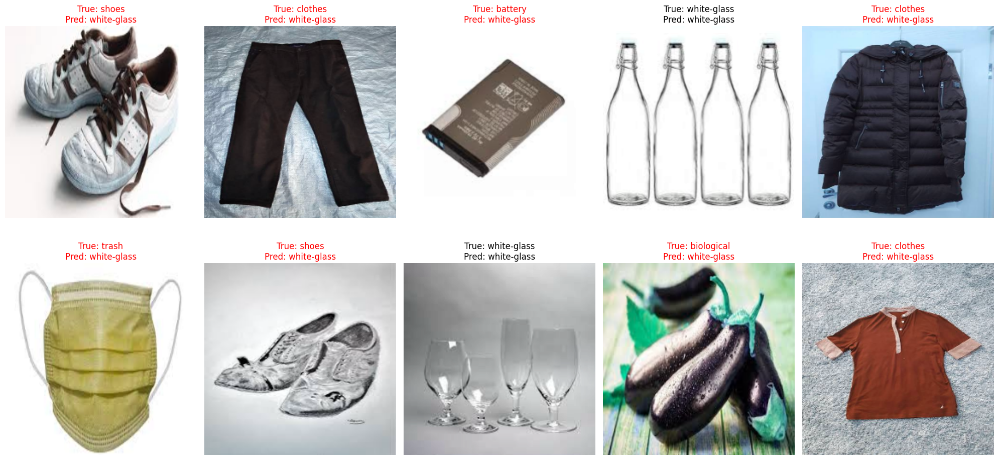

In [14]:
# Predict the classes of the first 10 images in the validation set
validation_images, validation_labels = next(validation_generator)
predictions = cnn_model.predict(validation_images[:-1])

# Convert the predictions to class indices
predicted_classes = np.argmax(predictions, axis=1)

# Plot the first 10 validation images with their true and predicted labels
plt.figure(figsize=(20, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(array_to_img(validation_images[i]))
    true_label = classes[validation_labels[i]]
    predicted_label = classes[predicted_classes[i]]
    title = f"True: {true_label}\nPred: {predicted_label}"
    if true_label != predicted_label:
        plt.title(title, color='red')  # Title in red if prediction is wrong
    else:
        plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [15]:
# Create lists to store data for the first 10 predictions
true_labels = [classes[label] for label in validation_labels[:10]]
predicted_labels = [classes[predicted_classes[i]] for i in range(10)]
correct_predictions = [true_labels[i] == predicted_labels[i] for i in range(10)]

# Create a DataFrame to store the predictions, true labels, and comparison for the first 10 predictions
data = {'True Label': true_labels,
        'Predicted Label': predicted_labels,
        'Correct Prediction': correct_predictions}

# Convert the dictionary to a DataFrame
predictions_df = pd.DataFrame(data)

# Print the DataFrame
predictions_df

,True Label,Predicted Label,Correct Prediction
0,shoes,white-glass,False
1,clothes,white-glass,False
2,battery,white-glass,False
3,white-glass,white-glass,True
4,clothes,white-glass,False
5,trash,white-glass,False
6,shoes,white-glass,False
7,white-glass,white-glass,True
8,biological,white-glass,False
9,clothes,white-glass,False


#### CNN 2

In [16]:
# Custom CNN Model 2
cnn2_model = Sequential()
cnn2_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
cnn2_model.add(MaxPooling2D((2, 2)))
cnn2_model.add(Conv2D(64, (3, 3), activation='relu'))
cnn2_model.add(MaxPooling2D((2, 2)))
cnn2_model.add(Conv2D(128, (3, 3), activation='relu'))
cnn2_model.add(MaxPooling2D((2, 2)))
cnn2_model.add(Conv2D(256, (3, 3), activation='relu'))
cnn2_model.add(MaxPooling2D((2, 2)))
cnn2_model.add(Conv2D(512, (3, 3), activation='relu'))
cnn2_model.add(MaxPooling2D((2, 2)))
cnn2_model.add(Flatten())
cnn2_model.add(Dense(256, activation='relu'))
cnn2_model.add(Dropout(0.5))  # Adding dropout for regularization
cnn2_model.add(Dense(len(classes), activation='softmax'))

cnn2_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model
cnn2_history = cnn2_model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator,
    callbacks=[early_stopping]
)

cnn2_model.summary()


Epoch 1/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 157s 383ms/step - accuracy: 0.3636 - loss: 2.0684 - val_accuracy: 0.5176 - val_loss: 3.5597
Epoch 2/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 142s 359ms/step - accuracy: 0.5070 - loss: 1.5966 - val_accuracy: 0.5082 - val_loss: 3.6973
Epoch 3/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 141s 357ms/step - accuracy: 0.4839 - loss: 2.4498 - val_accuracy: 0.5923 - val_loss: 1.4915
Epoch 4/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 142s 358ms/step - accuracy: 0.5522 - loss: 1.3570 - val_accuracy: 0.5282 - val_loss: 2.1618
Epoch 5/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 142s 358ms/step - accuracy: 0.5448 - loss: 1.3744 - val_accuracy: 0.5546 - val_loss: 1.6158
Epoch 6/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 145s 368ms/step - accuracy: 0.5547 - loss: 1.3044 - val_accuracy: 0.6465 - val_loss: 1.1857
Epoch 7/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 144s 365ms/step - accuracy: 0.5870 - loss: 1.2420 - val_accuracy: 0.6629 - val_loss: 1.0636
Epoch 8/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 143s 361ms/step - accuracy: 0.6009 -

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 10, 10, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 5, 5, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │     3,277,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 12)             │         3,084 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,546,150 (55.49 MB)

 Trainable params: 4,848,716 (18.50 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,697,434 (36.99 MB)

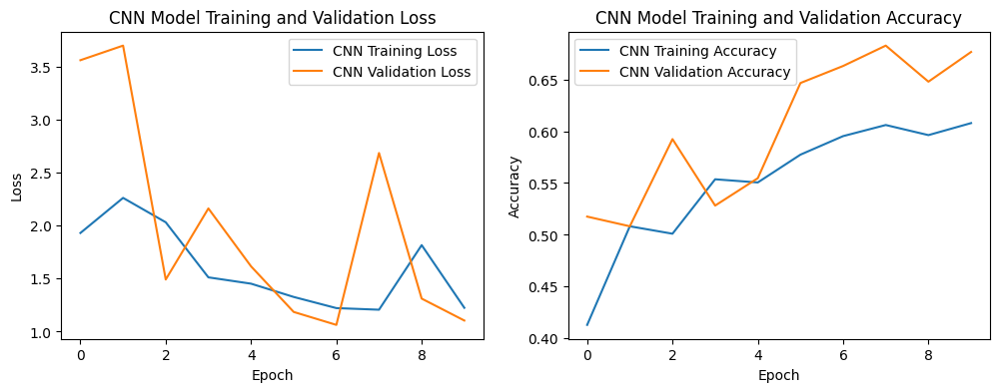

In [24]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 2)
plt.plot(cnn2_history.history['accuracy'], label='CNN Training Accuracy')
plt.plot(cnn2_history.history['val_accuracy'], label='CNN Validation Accuracy')
plt.legend()
plt.title('CNN Model Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 1)
plt.plot(cnn2_history.history['loss'], label='CNN Training Loss')
plt.plot(cnn2_history.history['val_loss'], label='CNN Validation Loss')
plt.title('CNN Model Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.show()

In [25]:
cnn2_train_loss, cnn2_train_accuracy = cnn2_model.evaluate(train_generator)
print(f"CNN Train Loss: {cnn2_train_loss}")
print(f"CNN Train Accuracy: {cnn2_train_accuracy}")

388/388 ━━━━━━━━━━━━━━━━━━━━ 141s 364ms/step - accuracy: 0.6200 - loss: 1.1067
CNN Train Loss: 1.0951210260391235
CNN Train Accuracy: 0.6257653832435608


In [26]:
cnn2_test_loss, cnn2_test_accuracy = cnn2_model.evaluate(validation_generator)
print(f"CNN Test Loss: {cnn2_test_loss}")
print(f"CNN Test Accuracy: {cnn2_test_accuracy}")

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6798 - loss: 1.0175
CNN Test Loss: 1.0953543186187744
CNN Test Accuracy: 0.6638736724853516


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step


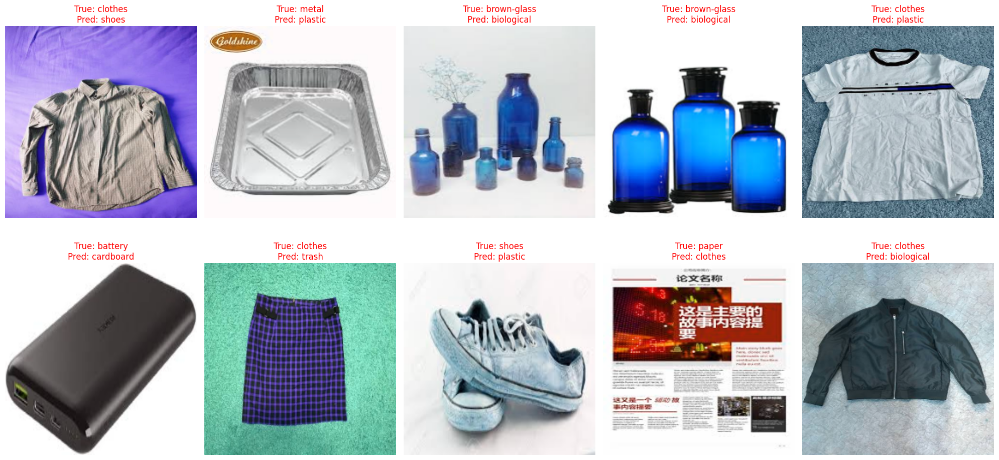

In [27]:
# Predict the classes of the first 10 images in the validation set
validation_images, validation_labels = next(validation_generator)
predictions = cnn2_model.predict(validation_images[:10])

# Convert the predictions to class indices
predicted_classes = np.argmax(predictions, axis=1)

# Plot the first 10 validation images with their true and predicted labels
plt.figure(figsize=(20, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(array_to_img(validation_images[i]))
    true_label = classes[validation_labels[i]]
    predicted_label = classes[predicted_classes[i]]
    title = f"True: {true_label}\nPred: {predicted_label}"
    if true_label != predicted_label:
        plt.title(title, color='red')  # Title in red if prediction is wrong
    else:
        plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [35]:
# Create lists to store data for the first 10 predictions
true_labels = [classes[label] for label in validation_labels[:10]]
predicted_labels = [classes[predicted_classes[i]] for i in range(10)]
correct_predictions = [true_labels[i] == predicted_labels[i] for i in range(10)]

# Create a DataFrame to store the predictions, true labels, and comparison for the first 10 predictions
data = {'True Label': true_labels,
        'Predicted Label': predicted_labels,
        'Correct Prediction': correct_predictions}

# Convert the dictionary to a DataFrame
predictions_df = pd.DataFrame(data)

# Print the DataFrame
predictions_df

,True Label,Predicted Label,Correct Prediction
0,plastic,shoes,False
1,metal,brown-glass,False
2,trash,trash,True
3,clothes,clothes,True
4,plastic,metal,False
5,battery,battery,True
6,clothes,clothes,True
7,plastic,clothes,False
8,clothes,clothes,True
9,shoes,shoes,True


#### DenseNet121

In [12]:
# Load pre-trained DenseNet121 model
densenet_base = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the convolutional layers
for layer in densenet_base.layers:
    layer.trainable = False

# Build the model
densenet_model = Sequential()
densenet_model.add(densenet_base)
densenet_model.add(Flatten())
densenet_model.add(Dense(256, activation='relu'))
densenet_model.add(Dense(len(classes), activation='softmax'))

# Compile the model
densenet_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model
densenet_history = densenet_model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator,
    callbacks=[early_stopping]
)

densenet_model.summary()

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/15
  2/388 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - accuracy: 0.1328 - loss: 10.3309 

W0000 00:00:1717658819.060863     464 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


388/388 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step - accuracy: 0.7096 - loss: 3.0189

W0000 00:00:1717658996.434251     464 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


388/388 ━━━━━━━━━━━━━━━━━━━━ 243s 529ms/step - accuracy: 0.7099 - loss: 3.0142 - val_accuracy: 0.8859 - val_loss: 0.4044
Epoch 2/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 156s 396ms/step - accuracy: 0.8696 - loss: 0.4222 - val_accuracy: 0.8898 - val_loss: 0.3718
Epoch 3/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 156s 396ms/step - accuracy: 0.8927 - loss: 0.3446 - val_accuracy: 0.8995 - val_loss: 0.3364
Epoch 4/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 156s 394ms/step - accuracy: 0.9031 - loss: 0.3082 - val_accuracy: 0.9178 - val_loss: 0.2692
Epoch 5/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 156s 394ms/step - accuracy: 0.9087 - loss: 0.2887 - val_accuracy: 0.9191 - val_loss: 0.2681
Epoch 6/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 155s 393ms/step - accuracy: 0.9153 - loss: 0.2553 - val_accuracy: 0.9014 - val_loss: 0.3534
Epoch 7/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 156s 395ms/step - accuracy: 0.9156 - loss: 0.2530 - val_accuracy: 0.9236 - val_loss: 0.2850
Epoch 8/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 154s 391ms/step - accuracy: 0.9242 - loss: 0.24

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 12)             │         3,084 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 45,582,694 (173.88 MB)

 Trainable params: 12,848,396 (49.01 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

 Optimizer params: 25,696,794 (98.03 MB)

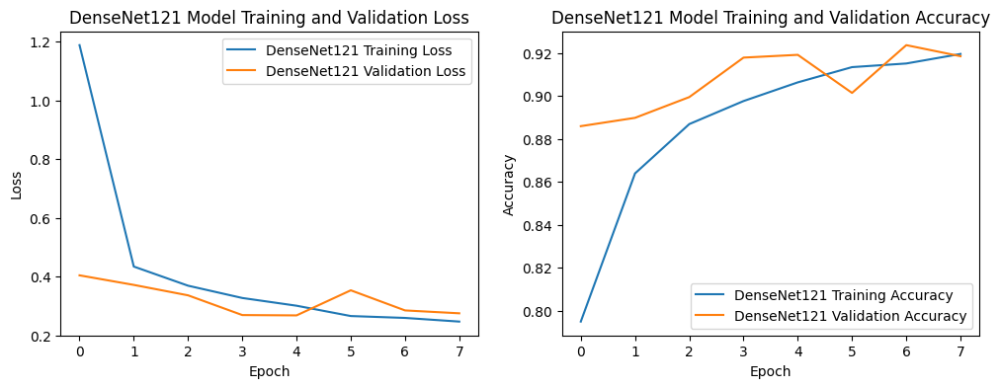

In [13]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 2)
plt.plot(densenet_history.history['accuracy'], label='DenseNet121 Training Accuracy')
plt.plot(densenet_history.history['val_accuracy'], label='DenseNet121 Validation Accuracy')
plt.legend()
plt.title('DenseNet121 Model Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 1)
plt.plot(densenet_history.history['loss'], label='DenseNet121 Training Loss')
plt.plot(densenet_history.history['val_loss'], label='DenseNet121 Validation Loss')
plt.title('DenseNet121 Model Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.show()

In [14]:
densenet_train_loss, densenet_train_accuracy = densenet_model.evaluate(train_generator)
print(f"DenseNet121 Train Loss: {densenet_train_loss}")
print(f"DenseNet121 Train Accuracy: {densenet_train_accuracy}")

388/388 ━━━━━━━━━━━━━━━━━━━━ 153s 393ms/step - accuracy: 0.9032 - loss: 0.2827
DenseNet121 Train Loss: 0.27593129873275757
DenseNet121 Train Accuracy: 0.9059780836105347


In [15]:
densenet_test_loss, densenet_test_accuracy = densenet_model.evaluate(validation_generator)
print(f"DenseNet121 Test Loss: {densenet_test_loss}")
print(f"DenseNet121 Test Accuracy: {densenet_test_accuracy}")

97/97 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - accuracy: 0.9071 - loss: 0.3001
DenseNet121 Test Loss: 0.2680701017379761
DenseNet121 Test Accuracy: 0.9191105365753174


1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step


W0000 00:00:1717660320.182006     463 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


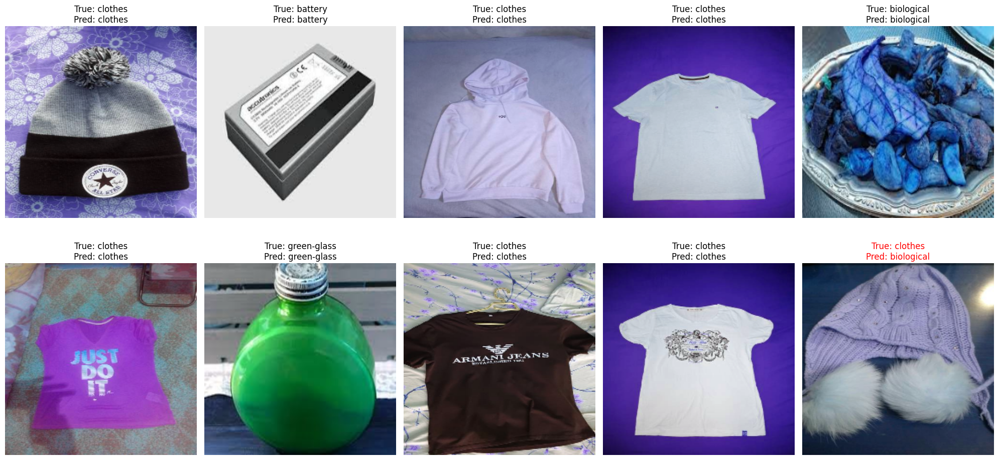

In [16]:
# Predict the classes of the first 10 images in the validation set
validation_images, validation_labels = next(validation_generator)
predictions = densenet_model.predict(validation_images[:10])

# Convert the predictions to class indices
predicted_classes = np.argmax(predictions, axis=1)

# Plot the first 10 validation images with their true and predicted labels
plt.figure(figsize=(20, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(array_to_img(validation_images[i]))
    true_label = classes[validation_labels[i]]
    predicted_label = classes[predicted_classes[i]]
    title = f"True: {true_label}\nPred: {predicted_label}"
    if true_label != predicted_label:
        plt.title(title, color='red')
    else:
        plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [17]:
# Create lists to store data for the first 10 predictions
true_labels = [classes[label] for label in validation_labels[:10]]
predicted_labels = [classes[predicted_classes[i]] for i in range(10)]
correct_predictions = [true_labels[i] == predicted_labels[i] for i in range(10)]

# Create a DataFrame to store the predictions, true labels, and comparison for the first 10 predictions
data = {'True Label': true_labels,
        'Predicted Label': predicted_labels,
        'Correct Prediction': correct_predictions}

# Convert the dictionary to a DataFrame
predictions_df = pd.DataFrame(data)

# Print the DataFrame
predictions_df

,True Label,Predicted Label,Correct Prediction
0,clothes,clothes,True
1,battery,battery,True
2,clothes,clothes,True
3,clothes,clothes,True
4,biological,biological,True
5,clothes,clothes,True
6,green-glass,green-glass,True
7,clothes,clothes,True
8,clothes,clothes,True
9,clothes,biological,False


#### DenseNet201

In [21]:
# Load pre-trained DenseNet201 model
densenet2_base = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the convolutional layers
for layer in densenet_base.layers:
    layer.trainable = False

# Build the model
densenet2_model = Sequential()
densenet2_model.add(densenet_base)
densenet2_model.add(Flatten())
densenet2_model.add(Dense(256, activation='relu'))
densenet2_model.add(Dense(len(classes), activation='softmax'))

# Compile the model
densenet2_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model
densenet2_history = densenet2_model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator,
    callbacks=[early_stopping]
)

densenet2_model.summary()

74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/15
  2/388 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - accuracy: 0.0938 - loss: 9.0378  

W0000 00:00:1717660452.539519     464 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


388/388 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step - accuracy: 0.6840 - loss: 3.5053

W0000 00:00:1717660610.343558     461 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


388/388 ━━━━━━━━━━━━━━━━━━━━ 194s 440ms/step - accuracy: 0.6843 - loss: 3.4996 - val_accuracy: 0.8940 - val_loss: 0.3476
Epoch 2/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 154s 391ms/step - accuracy: 0.8606 - loss: 0.4517 - val_accuracy: 0.9027 - val_loss: 0.2938
Epoch 3/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 155s 392ms/step - accuracy: 0.8944 - loss: 0.3387 - val_accuracy: 0.8966 - val_loss: 0.3716
Epoch 4/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 157s 397ms/step - accuracy: 0.8955 - loss: 0.3333 - val_accuracy: 0.9136 - val_loss: 0.2725
Epoch 5/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 156s 394ms/step - accuracy: 0.9033 - loss: 0.2964 - val_accuracy: 0.9172 - val_loss: 0.2783
Epoch 6/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 202s 395ms/step - accuracy: 0.9111 - loss: 0.2781 - val_accuracy: 0.9256 - val_loss: 0.2424
Epoch 7/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 156s 395ms/step - accuracy: 0.9189 - loss: 0.2547 - val_accuracy: 0.9220 - val_loss: 0.2725
Epoch 8/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 154s 391ms/step - accuracy: 0.9169 - loss: 0.25

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 12)             │         3,084 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 45,582,694 (173.88 MB)

 Trainable params: 12,848,396 (49.01 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

 Optimizer params: 25,696,794 (98.03 MB)

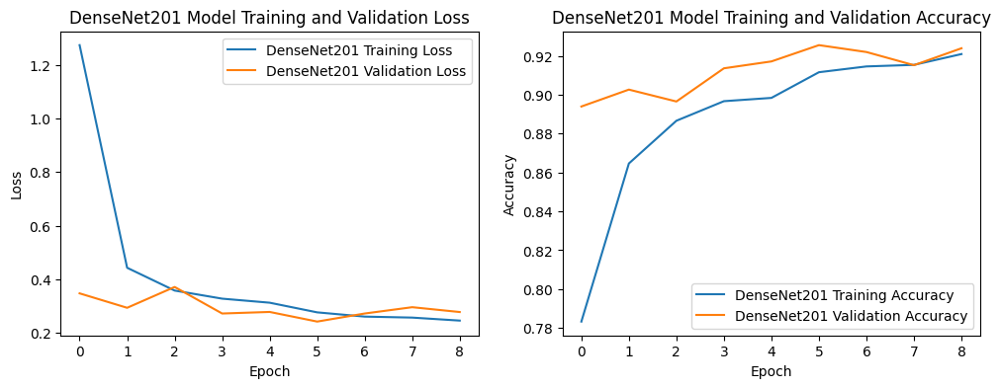

In [22]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 2)
plt.plot(densenet2_history.history['accuracy'], label='DenseNet201 Training Accuracy')
plt.plot(densenet2_history.history['val_accuracy'], label='DenseNet201 Validation Accuracy')
plt.legend()
plt.title('DenseNet201 Model Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 1)
plt.plot(densenet2_history.history['loss'], label='DenseNet201 Training Loss')
plt.plot(densenet2_history.history['val_loss'], label='DenseNet201 Validation Loss')
plt.title('DenseNet201 Model Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.show()

In [23]:
densenet2_train_loss, densenet2_train_accuracy = densenet2_model.evaluate(train_generator)
print(f"DenseNet201 Train Loss: {densenet2_train_loss}")
print(f"DenseNet201 Train Accuracy: {densenet2_train_accuracy}")

388/388 ━━━━━━━━━━━━━━━━━━━━ 154s 396ms/step - accuracy: 0.9229 - loss: 0.2322
DenseNet201 Train Loss: 0.23642495274543762
DenseNet201 Train Accuracy: 0.9216886758804321


In [24]:
densenet2_test_loss, densenet2_test_accuracy = densenet2_model.evaluate(validation_generator)
print(f"DenseNet2 Test Loss: {densenet2_test_loss}")
print(f"DenseNet2 Test Accuracy: {densenet2_test_accuracy}")

97/97 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - accuracy: 0.9259 - loss: 0.2363
DenseNet2 Test Loss: 0.24236993491649628
DenseNet2 Test Accuracy: 0.9255558848381042


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


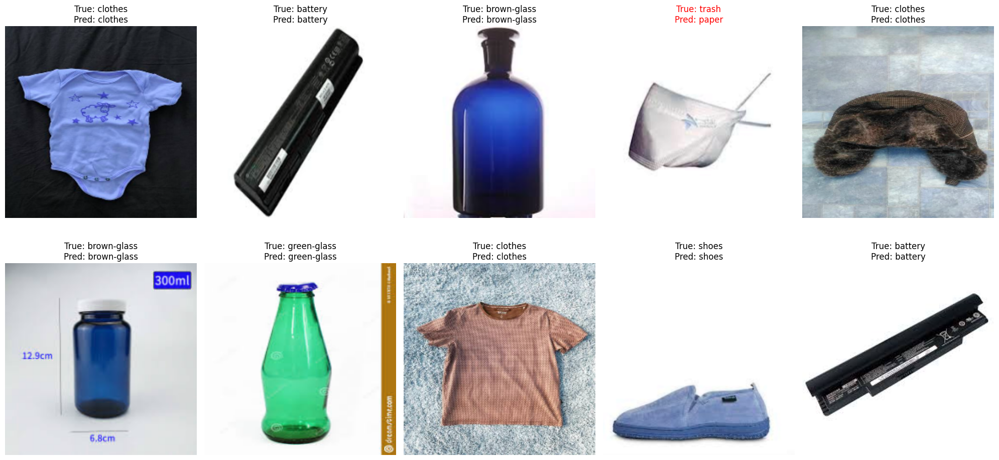

In [28]:
# Predict the classes of the first 10 images in the validation set
validation_images, validation_labels = next(validation_generator)
predictions = densenet2_model.predict(validation_images[:10])

# Convert the predictions to class indices
predicted_classes = np.argmax(predictions, axis=1)

# Plot the first 10 validation images with their true and predicted labels
plt.figure(figsize=(20, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(array_to_img(validation_images[i]))
    true_label = classes[validation_labels[i]]
    predicted_label = classes[predicted_classes[i]]
    title = f"True: {true_label}\nPred: {predicted_label}"
    if true_label != predicted_label:
        plt.title(title, color='red')  # Title in red if prediction is wrong
    else:
        plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [29]:
# Create lists to store data for the first 10 predictions
true_labels = [classes[label] for label in validation_labels[:10]]
predicted_labels = [classes[predicted_classes[i]] for i in range(10)]
correct_predictions = [true_labels[i] == predicted_labels[i] for i in range(10)]

# Create a DataFrame to store the predictions, true labels, and comparison for the first 10 predictions
data = {'True Label': true_labels,
        'Predicted Label': predicted_labels,
        'Correct Prediction': correct_predictions}

# Convert the dictionary to a DataFrame
predictions_df = pd.DataFrame(data)

# Print the DataFrame
predictions_df

,True Label,Predicted Label,Correct Prediction
0,clothes,clothes,True
1,battery,battery,True
2,brown-glass,brown-glass,True
3,trash,paper,False
4,clothes,clothes,True
5,brown-glass,brown-glass,True
6,green-glass,green-glass,True
7,clothes,clothes,True
8,shoes,shoes,True
9,battery,battery,True


#### VGG16

In [36]:
# Load the VGG-16 model with pre-trained weights, excluding the top (classification) layers
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model
for layer in vgg16_base.layers:
    layer.trainable = False

# Define the model architecture
vgg16_model = Sequential([
    vgg16_base,
    #Flatten(input_shape=base_model.output_shape[1:]),
    Flatten(),
    Dense(512, activation='relu'),
    BatchNormalization(),  # Added batch normalization
    Dropout(0.5),
    Dense(512, activation='relu'),
    BatchNormalization(),  # Added batch normalization
    Dropout(0.5),
    Dense(len(classes), activation='softmax')
])

# Compile the model
vgg16_model.compile(optimizer=Adam(learning_rate=0.001),loss=sparse_categorical_crossentropy,metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model using the augmented data
vgg16_history = vgg16_model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // 32,
    epochs=18,  
    validation_data=validation_generator,
    validation_steps=len(X_test) // 32,
    callbacks=[early_stopping] 
)

vgg16_model.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/18
  1/387 ━━━━━━━━━━━━━━━━━━━━ 4:24:45 41s/step - accuracy: 0.0312 - loss: 4.2533

W0000 00:00:1717665002.339863     463 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


308/387 ━━━━━━━━━━━━━━━━━━━━ 38s 487ms/step - accuracy: 0.5559 - loss: 1.6253

W0000 00:00:1717665151.808967     462 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


387/387 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step - accuracy: 0.5728 - loss: 1.5509

W0000 00:00:1717665181.235371     464 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


387/387 ━━━━━━━━━━━━━━━━━━━━ 233s 496ms/step - accuracy: 0.5730 - loss: 1.5500 - val_accuracy: 0.8115 - val_loss: 0.6486
Epoch 2/18
  1/387 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - accuracy: 0.7188 - loss: 0.6948

W0000 00:00:1717665226.236317     463 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


387/387 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - accuracy: 0.7188 - loss: 0.6948 - val_accuracy: 0.8710 - val_loss: 0.4873
Epoch 3/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 162s 412ms/step - accuracy: 0.7303 - loss: 0.8883 - val_accuracy: 0.8509 - val_loss: 0.4489
Epoch 4/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - accuracy: 0.5938 - loss: 1.2340 - val_accuracy: 0.8387 - val_loss: 0.5173
Epoch 5/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 163s 415ms/step - accuracy: 0.7701 - loss: 0.7267 - val_accuracy: 0.8613 - val_loss: 0.4439
Epoch 6/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 0s 626us/step - accuracy: 0.6250 - loss: 1.0380 - val_accuracy: 0.9355 - val_loss: 0.1591
Epoch 7/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 162s 412ms/step - accuracy: 0.7848 - loss: 0.6568 - val_accuracy: 0.8848 - val_loss: 0.3671
Epoch 8/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - accuracy: 0.7500 - loss: 0.7235 - val_accuracy: 0.8065 - val_loss: 0.4831
Epoch 9/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 163s 413ms/step - accuracy: 0.8026 - loss: 0.6149 - val

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 12)             │         6,156 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 54,066,022 (206.25 MB)

 Trainable params: 13,116,428 (50.04 MB)

 Non-trainable params: 14,716,736 (56.14 MB)

 Optimizer params: 26,232,858 (100.07 MB)

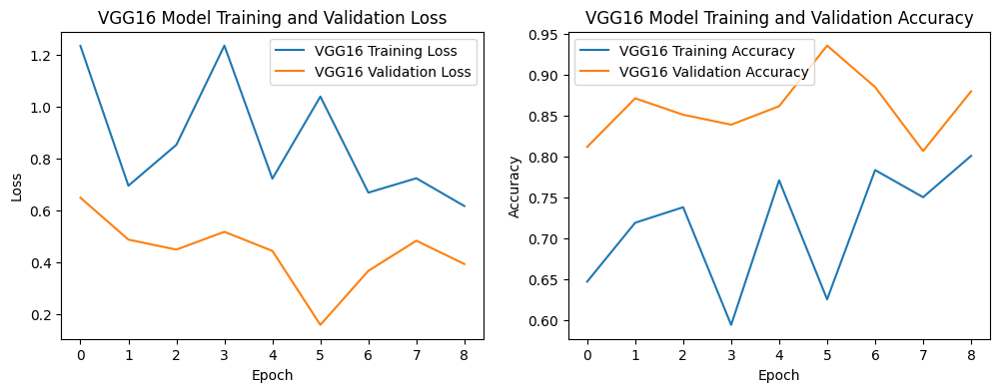

In [37]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 2)
plt.plot(vgg16_history.history['accuracy'], label='VGG16 Training Accuracy')
plt.plot(vgg16_history.history['val_accuracy'], label='VGG16 Validation Accuracy')
plt.legend()
plt.title('VGG16 Model Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 1)
plt.plot(vgg16_history.history['loss'], label='VGG16 Training Loss')
plt.plot(vgg16_history.history['val_loss'], label='VGG16 Validation Loss')
plt.title('VGG16 Model Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.show()

In [38]:
vgg16_train_loss, vgg16_train_accuracy = vgg16_model.evaluate(train_generator)
print(f"VGG16 Train Loss: {vgg16_train_loss}")
print(f"VGG16 Train Accuracy: {vgg16_train_accuracy}")

388/388 ━━━━━━━━━━━━━━━━━━━━ 149s 384ms/step - accuracy: 0.8361 - loss: 0.4883
VGG16 Train Loss: 0.5129812955856323
VGG16 Train Accuracy: 0.8300837874412537


W0000 00:00:1717666098.125279     461 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [39]:
vgg16_test_loss, vgg16_test_accuracy = vgg16_model.evaluate(validation_generator)
print(f"VGG16 Test Loss: {vgg16_test_loss}")
print(f"VGG16 Test Accuracy: {vgg16_test_accuracy}")

97/97 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - accuracy: 0.8674 - loss: 0.4130
VGG16 Test Loss: 0.43966394662857056
VGG16 Test Accuracy: 0.8627135157585144


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


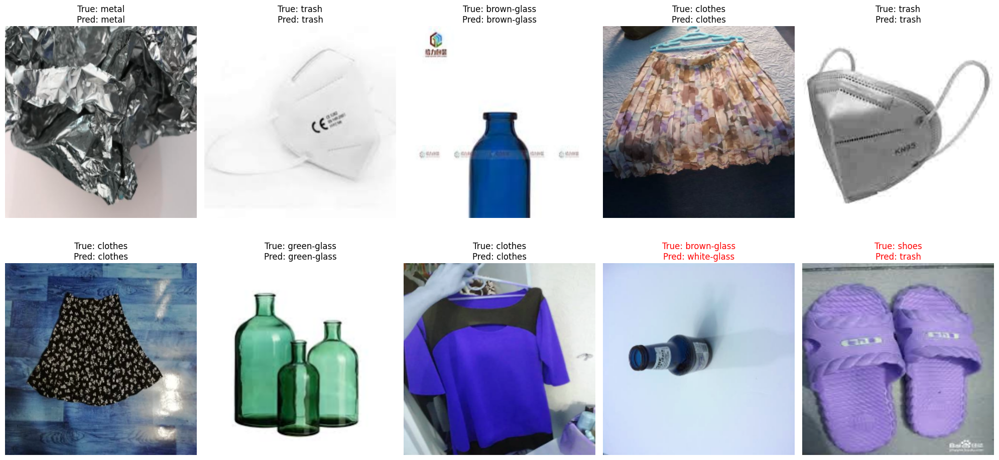

In [41]:
# Predict the classes of the first 10 images in the validation set
validation_images, validation_labels = next(validation_generator)
predictions = vgg16_model.predict(validation_images[:10])

# Convert the predictions to class indices
predicted_classes = np.argmax(predictions, axis=1)

# Plot the first 10 validation images with their true and predicted labels
plt.figure(figsize=(20, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(array_to_img(validation_images[i]))
    true_label = classes[validation_labels[i]]
    predicted_label = classes[predicted_classes[i]]
    title = f"True: {true_label}\nPred: {predicted_label}"
    if true_label != predicted_label:
        plt.title(title, color='red')  
    else:
        plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [43]:
# Create lists to store data for the first 10 predictions
true_labels = [classes[label] for label in validation_labels[:10]]
predicted_labels = [classes[predicted_classes[i]] for i in range(10)]
correct_predictions = [true_labels[i] == predicted_labels[i] for i in range(10)]

# Create a DataFrame to store the predictions, true labels, and comparison for the first 10 predictions
data = {'True Label': true_labels,
        'Predicted Label': predicted_labels,
        'Correct Prediction': correct_predictions}

# Convert the dictionary to a DataFrame
predictions_df = pd.DataFrame(data)

# Print the DataFrame
predictions_df

,True Label,Predicted Label,Correct Prediction
0,metal,metal,True
1,trash,trash,True
2,brown-glass,brown-glass,True
3,clothes,clothes,True
4,trash,trash,True
5,clothes,clothes,True
6,green-glass,green-glass,True
7,clothes,clothes,True
8,brown-glass,white-glass,False
9,shoes,trash,False


#### VGG19

In [44]:
# Load the VGG-16 model with pre-trained weights, excluding the top (classification) layers
vgg19_base = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model
for layer in vgg16_base.layers:
    layer.trainable = False

# Define the model architecture
vgg19_model = Sequential([
    vgg19_base,
    #Flatten(input_shape=base_model.output_shape[1:]),
    Flatten(),
    Dense(512, activation='relu'),
    BatchNormalization(),  # Added batch normalization
    Dropout(0.5),
    Dense(512, activation='relu'),
    BatchNormalization(),  # Added batch normalization
    Dropout(0.5),
    Dense(len(classes), activation='softmax')
])

# Compile the model
vgg19_model.compile(optimizer=Adam(learning_rate=0.001),loss=sparse_categorical_crossentropy,metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model using the augmented data
vgg19_history = vgg19_model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // 32,
    epochs=18,  
    validation_data=validation_generator,
    validation_steps=len(X_test) // 32,
    callbacks=[early_stopping] 
)

vgg19_model.summary()


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/18


W0000 00:00:1717666366.578270     463 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


276/387 ━━━━━━━━━━━━━━━━━━━━ 52s 476ms/step - accuracy: 0.2532 - loss: 2.8657

W0000 00:00:1717666545.206957     464 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


387/387 ━━━━━━━━━━━━━━━━━━━━ 0s 599ms/step - accuracy: 0.2703 - loss: 2.7531

W0000 00:00:1717666599.380419     461 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


387/387 ━━━━━━━━━━━━━━━━━━━━ 308s 639ms/step - accuracy: 0.2704 - loss: 2.7523 - val_accuracy: 0.4066 - val_loss: 1.8445
Epoch 2/18
  1/387 ━━━━━━━━━━━━━━━━━━━━ 2:58 464ms/step - accuracy: 0.4062 - loss: 2.2143

W0000 00:00:1717666615.200401     464 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


387/387 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4062 - loss: 2.2143 - val_accuracy: 0.4839 - val_loss: 1.5905
Epoch 3/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 202s 513ms/step - accuracy: 0.3757 - loss: 2.0694 - val_accuracy: 0.4362 - val_loss: 1944916.1250
Epoch 4/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 1s 694us/step - accuracy: 0.3750 - loss: 2.1896 - val_accuracy: 0.5161 - val_loss: 1.3995
Epoch 5/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 201s 512ms/step - accuracy: 0.3831 - loss: 1.9222 - val_accuracy: 0.4020 - val_loss: 2.3649
Epoch 6/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 1s 410us/step - accuracy: 0.4375 - loss: 1.7416 - val_accuracy: 0.3548 - val_loss: 2.4141
Epoch 7/18
387/387 ━━━━━━━━━━━━━━━━━━━━ 201s 511ms/step - accuracy: 0.4140 - loss: 1.8253 - val_accuracy: 0.3620 - val_loss: 5.1438


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)              │ (None, 7, 7, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 12)             │         6,156 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 99,424,486 (379.27 MB)

 Trainable params: 33,140,812 (126.42 MB)

 Non-trainable params: 2,048 (8.00 KB)

 Optimizer params: 66,281,626 (252.84 MB)

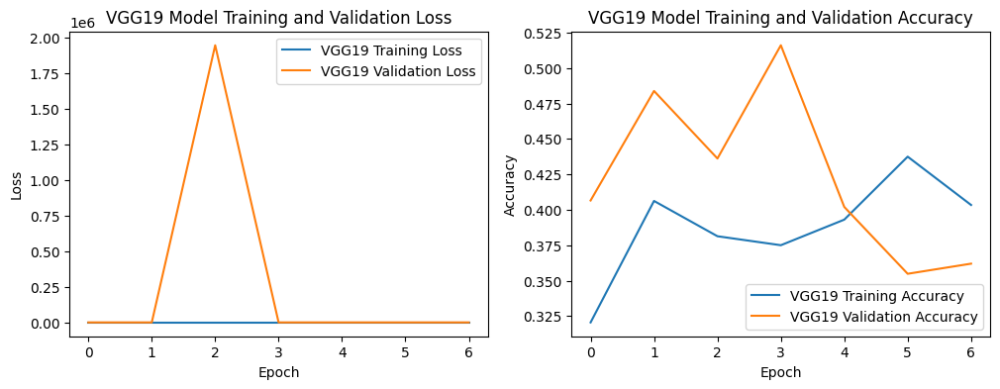

In [45]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 2)
plt.plot(vgg19_history.history['accuracy'], label='VGG19 Training Accuracy')
plt.plot(vgg19_history.history['val_accuracy'], label='VGG19 Validation Accuracy')
plt.legend()
plt.title('VGG19 Model Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 1)
plt.plot(vgg19_history.history['loss'], label='VGG19 Training Loss')
plt.plot(vgg19_history.history['val_loss'], label='VGG19 Validation Loss')
plt.title('VGG19 Model Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.show()

In [46]:
vgg19_train_loss, vgg19_train_accuracy = vgg19_model.evaluate(train_generator)
print(f"VGG19 Train Loss: {vgg19_train_loss}")
print(f"VGG19 Train Accuracy: {vgg19_train_accuracy}")

388/388 ━━━━━━━━━━━━━━━━━━━━ 149s 384ms/step - accuracy: 0.4105 - loss: 4504968.0000
VGG19 Train Loss: 4322833.5
VGG19 Train Accuracy: 0.4049307107925415


W0000 00:00:1717667397.144995     464 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [47]:
vgg19_test_loss, vgg19_test_accuracy = vgg19_model.evaluate(validation_generator)
print(f"VGG19 Test Loss: {vgg19_test_loss}")
print(f"VGG19 Test Accuracy: {vgg19_test_accuracy}")

97/97 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - accuracy: 0.4293 - loss: 2512800.7500
VGG19 Test Loss: 2969559.0
VGG19 Test Accuracy: 0.4353851079940796


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 819ms/step


W0000 00:00:1717667425.088531     463 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


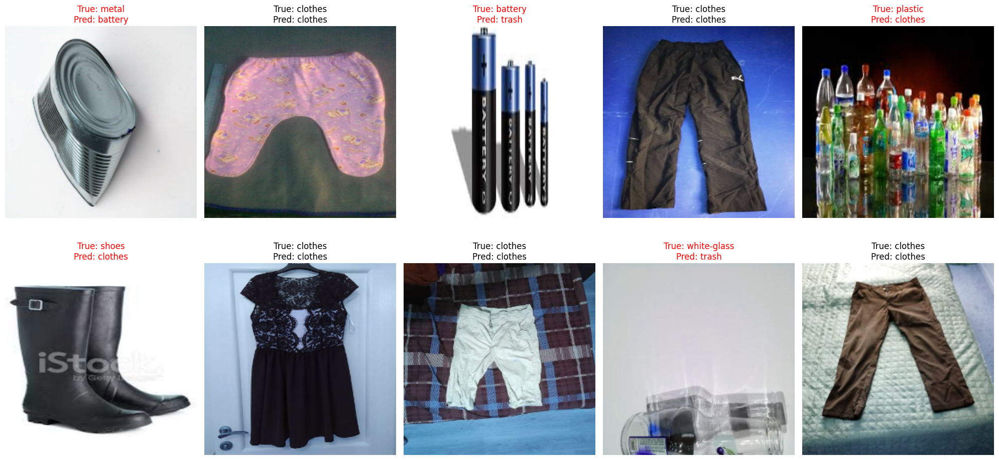

In [48]:
# Predict the classes of the first 10 images in the validation set
validation_images, validation_labels = next(validation_generator)
predictions = vgg19_model.predict(validation_images[:10])

# Convert the predictions to class indices
predicted_classes = np.argmax(predictions, axis=1)

# Plot the first 10 validation images with their true and predicted labels
plt.figure(figsize=(20, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(array_to_img(validation_images[i]))
    true_label = classes[validation_labels[i]]
    predicted_label = classes[predicted_classes[i]]
    title = f"True: {true_label}\nPred: {predicted_label}"
    if true_label != predicted_label:
        plt.title(title, color='red')  # Title in red if prediction is wrong
    else:
        plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [49]:
# Create lists to store data for the first 10 predictions
true_labels = [classes[label] for label in validation_labels[:10]]
predicted_labels = [classes[predicted_classes[i]] for i in range(10)]
correct_predictions = [true_labels[i] == predicted_labels[i] for i in range(10)]

# Create a DataFrame to store the predictions, true labels, and comparison for the first 10 predictions
data = {'True Label': true_labels,
        'Predicted Label': predicted_labels,
        'Correct Prediction': correct_predictions}

# Convert the dictionary to a DataFrame
predictions_df = pd.DataFrame(data)

# Print the DataFrame
predictions_df

,True Label,Predicted Label,Correct Prediction
0,metal,battery,False
1,clothes,clothes,True
2,battery,trash,False
3,clothes,clothes,True
4,plastic,clothes,False
5,shoes,clothes,False
6,clothes,clothes,True
7,clothes,clothes,True
8,white-glass,trash,False
9,clothes,clothes,True


#### ResNet

In [50]:
# Load pre-trained ResNet50 model
resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the convolutional layers
for layer in resnet_base.layers:
    layer.trainable = False

# Build the model
resnet_model = Sequential()
resnet_model.add(resnet_base)
resnet_model.add(Flatten())
resnet_model.add(Dense(256, activation='relu'))
resnet_model.add(Dense(len(classes), activation='softmax'))

# Compile the model
resnet_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model
resnet_history = resnet_model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator,
    callbacks=[early_stopping]
)

resnet_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 193s 447ms/step - accuracy: 0.3044 - loss: 4.0683 - val_accuracy: 0.3706 - val_loss: 1.9657
Epoch 2/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 155s 392ms/step - accuracy: 0.3554 - loss: 2.0008 - val_accuracy: 0.3890 - val_loss: 1.8817
Epoch 3/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 156s 395ms/step - accuracy: 0.3694 - loss: 1.9419 - val_accuracy: 0.4025 - val_loss: 1.8197
Epoch 4/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 154s 390ms/step - accuracy: 0.3766 - loss: 1.8964 - val_accuracy: 0.4106 - val_loss: 1.8132
Epoch 5/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 157s 398ms/step - accuracy: 0.3786 - loss: 1.8965 - val_accuracy: 0.4280 - val_loss: 1.7528
Epoch 6/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 159s 402ms/step - accuracy: 0.3905 - loss: 1.8371 - val_accuracy: 0.4518 - val_loss: 1.7422
Epoch 7/15
388/388 ━━━━━━━━━━━━━━━━━━━━ 158s 400ms/step - accuracy: 0.3974 - loss: 1.8403 - val_accuracy: 0.4393 - val_loss: 1.6936
Epoch 8/15
388/388 ━━━━━━

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 12)             │         3,084 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 100,668,070 (384.02 MB)

 Trainable params: 25,693,452 (98.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 51,386,906 (196.03 MB)

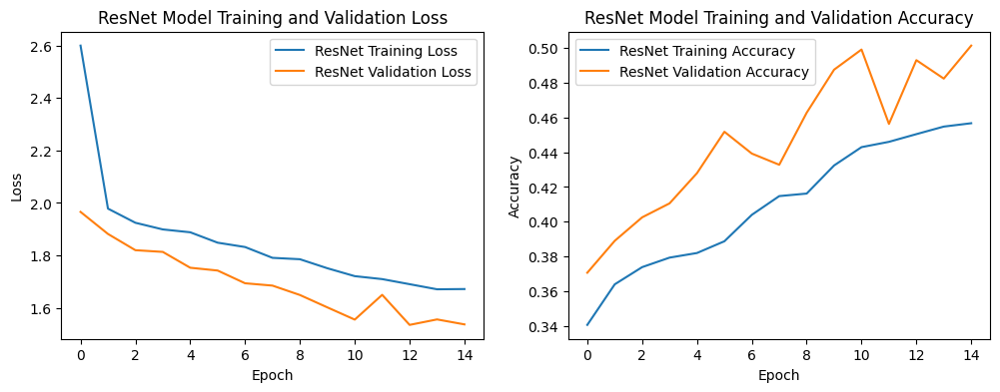

In [51]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 2)
plt.plot(resnet_history.history['accuracy'], label='ResNet Training Accuracy')
plt.plot(resnet_history.history['val_accuracy'], label='ResNet Validation Accuracy')
plt.legend()
plt.title('ResNet Model Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 1)
plt.plot(resnet_history.history['loss'], label='ResNet Training Loss')
plt.plot(resnet_history.history['val_loss'], label='ResNet Validation Loss')
plt.title('ResNet Model Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.show()

In [52]:
resnet_train_loss, resnet_train_accuracy = resnet_model.evaluate(train_generator)
print(f"ResNet Train Loss: {resnet_train_loss}")
print(f"ResNet Train Accuracy: {resnet_train_accuracy}")

388/388 ━━━━━━━━━━━━━━━━━━━━ 152s 392ms/step - accuracy: 0.4534 - loss: 1.6638
ResNet Train Loss: 1.6472432613372803
ResNet Train Accuracy: 0.45891073346138


In [53]:
resnet_test_loss, resnet_test_accuracy = resnet_model.evaluate(validation_generator)
print(f"ResNet Test Loss: {resnet_test_loss}")
print(f"ResNet Test Accuracy: {resnet_test_accuracy}")

97/97 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - accuracy: 0.4812 - loss: 1.5759
ResNet Test Loss: 1.534937858581543
ResNet Test Accuracy: 0.49307122826576233


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


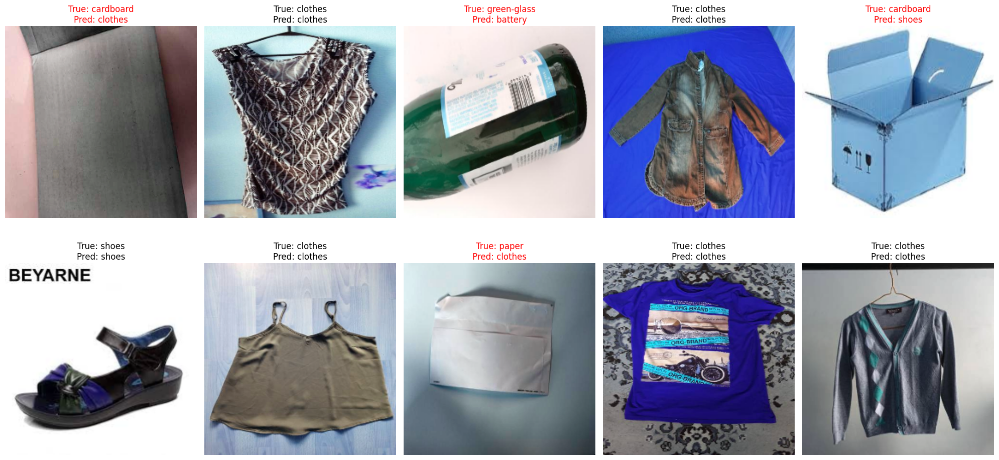

In [54]:
# Predict the classes of the first 10 images in the validation set
validation_images, validation_labels = next(validation_generator)
predictions = resnet_model.predict(validation_images[:10])

# Convert the predictions to class indices
predicted_classes = np.argmax(predictions, axis=1)

# Plot the first 10 validation images with their true and predicted labels
plt.figure(figsize=(20, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(array_to_img(validation_images[i]))
    true_label = classes[validation_labels[i]]
    predicted_label = classes[predicted_classes[i]]
    title = f"True: {true_label}\nPred: {predicted_label}"
    if true_label != predicted_label:
        plt.title(title, color='red')  # Title in red if prediction is wrong
    else:
        plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [55]:
# Create lists to store data for the first 10 predictions
true_labels = [classes[label] for label in validation_labels[:10]]
predicted_labels = [classes[predicted_classes[i]] for i in range(10)]
correct_predictions = [true_labels[i] == predicted_labels[i] for i in range(10)]

# Create a DataFrame to store the predictions, true labels, and comparison for the first 10 predictions
data = {'True Label': true_labels,
        'Predicted Label': predicted_labels,
        'Correct Prediction': correct_predictions}

# Convert the dictionary to a DataFrame
predictions_df = pd.DataFrame(data)

# Print the DataFrame
print(predictions_df)

    True Label Predicted Label  Correct Prediction
0    cardboard         clothes               False
1      clothes         clothes                True
2  green-glass         battery               False
3      clothes         clothes                True
4    cardboard           shoes               False
5        shoes           shoes                True
6      clothes         clothes                True
7        paper         clothes               False
8      clothes         clothes                True
9      clothes         clothes                True


#### InceptionV3

In [ ]:
# Load pre-trained InceptionV3 model
inception_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the convolutional layers
for layer in inception_base.layers:
    layer.trainable = False

# Build the model
inception_model = Sequential()
inception_model.add(inception_base)
inception_model.add(Flatten())
inception_model.add(Dense(256, activation='relu'))
inception_model.add(Dense(len(classes), activation='softmax'))

# Compile the model
inception_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model
inception_history = inception_model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator,
    callbacks=[early_stopping]
)

inception_model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/15
  2/388 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.1172 - loss: 30.1299 

W0000 00:00:1717670090.930886     464 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


357/388 ━━━━━━━━━━━━━━━━━━━━ 13s 426ms/step - accuracy: 0.6451 - loss: 4.8144

W0000 00:00:1717670242.415125     463 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


388/388 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - accuracy: 0.6533 - loss: 4.5566

W0000 00:00:1717670258.293519     462 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


388/388 ━━━━━━━━━━━━━━━━━━━━ 216s 486ms/step - accuracy: 0.6535 - loss: 4.5489 - val_accuracy: 0.8240 - val_loss: 0.5361
Epoch 2/15
130/388 ━━━━━━━━━━━━━━━━━━━━ 1:38 383ms/step - accuracy: 0.8243 - loss: 0.5838

In [ ]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 2)
plt.plot(inception_history.history['accuracy'], label='InceptionV3 Training Accuracy')
plt.plot(inception_history.history['val_accuracy'], label='InceptionV3 Validation Accuracy')
plt.legend()
plt.title('InceptionV3 Model Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 1)
plt.plot(inception_history.history['loss'], label='InceptionV3 Training Loss')
plt.plot(inception_history.history['val_loss'], label='InceptionV3 Validation Loss')
plt.title('InceptionV3 Model Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.show()

In [ ]:
inception_train_loss, inception_train_accuracy = inception_model.evaluate(train_generator)
print(f"Inception Train Loss: {inception_train_loss}")
print(f"Inception Train Accuracy: {inception_train_accuracy}")

In [ ]:
inception_test_loss, inception_test_accuracy = inception_model.evaluate(validation_generator)
print(f"Inception Test Loss: {inception_test_loss}")
print(f"Inception Test Accuracy: {inception_test_accuracy}")

In [ ]:
# Predict the classes of the first 10 images in the validation set
validation_images, validation_labels = next(validation_generator)
predictions = inception_model.predict(validation_images[:10])

# Convert the predictions to class indices
predicted_classes = np.argmax(predictions, axis=1)

# Plot the first 10 validation images with their true and predicted labels
plt.figure(figsize=(20, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(array_to_img(validation_images[i]))
    true_label = classes[validation_labels[i]]
    predicted_label = classes[predicted_classes[i]]
    title = f"True: {true_label}\nPred: {predicted_label}"
    if true_label != predicted_label:
        plt.title(title, color='red')  # Title in red if prediction is wrong
    else:
        plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Create lists to store data for the first 10 predictions
true_labels = [classes[label] for label in validation_labels[:10]]
predicted_labels = [classes[predicted_classes[i]] for i in range(10)]
correct_predictions = [true_labels[i] == predicted_labels[i] for i in range(10)]

# Create a DataFrame to store the predictions, true labels, and comparison for the first 10 predictions
data = {'True Label': true_labels,
        'Predicted Label': predicted_labels,
        'Correct Prediction': correct_predictions}

# Convert the dictionary to a DataFrame
predictions_df = pd.DataFrame(data)

# Print the DataFrame
print(predictions_df)

## 10. Model Comparison

In [ ]:
# Define a list or dictionary to store the results
results = []

# Iterate over your seven models
models = ['cnn_model', 'cnn2_model', 'densenet_model', 'densenet2_model', 'resnet_model', 'vgg16_model', 'vgg19_model']
for model_name in models:
    model = globals()[model_name]  # Retrieve the model object by its name
    
    # Evaluate the model
    train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
    # Predictions for F1 score calculation
    y_train_pred = model.predict_classes(X_train)
    y_test_pred = model.predict_classes(X_test)
    
    # Calculate F1 score
    train_f1 = f1_score(y_train, y_train_pred, average='weighted')
    test_f1 = f1_score(y_test, y_test_pred, average='weighted')
    
    # Append results to the list or dictionary
    results.append({
        'Model': model_name,
        'Train Loss': train_loss,
        'Test Loss': test_loss,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
        'Train F1 Score': train_f1,
        'Test F1 Score': test_f1
    })

# Convert the list or dictionary to a DataFrame
results_df = pd.DataFrame(results)

# Sort the DataFrame based on the test f1 score column
f1score_df = results_df.sort_values(by='Test F1 Score')

# Print the sorted DataFrame
print(f1score_df)

# Sort the DataFrame based on the test loss column
loss_df = results_df.sort_values(by='Test Loss')

# Print the sorted DataFrame
print(loss_df)

## 11. Model Selection

Performance was evaluated train and validation accuracies and losses, along with
f1score as key metrics. The DenseNet-201 model emerged as the best performing
one a validation accuracy of 92.45% and f1score of 93%

## 12. Summary

[Back to Table of Contents](#3.-Table-of-Contents)